# pyPetrograph — RGB porosity demo (v0.0.5)

Label pores and grains on three PPL test images, train a LightGBM pixel classifier, then report **porosity %** with uncertainty.

Example labels are already in `outputs/labels/` (cements from the old 3-class set were folded into grains). Set `RELABEL = True` to draw more.

No TensorFlow, U-Net, or SAM. Run cells **in order**. Outputs go to `outputs/` (`labels/`, `predictions/`, `models/`).


## Setup — check packages

In [1]:
from pathlib import Path
import sys
ROOT = Path(".")
if str(ROOT.resolve()) not in sys.path:
    sys.path.insert(0, str(ROOT.resolve()))

from pyPetrograph import check_and_install_packages
_ = check_and_install_packages(install=True)


Package check
----------------------------------------
  numpy                 ok
  PIL                   ok
  matplotlib            ok
  sklearn               ok
  scipy                 ok
  geopandas             ok
  shapely               ok
  rasterio              ok
  affine                ok
  joblib                ok
  pandas                ok
  lightgbm              ok
  skimage               ok
  PyQt5                 ok
----------------------------------------
All required packages are available.


## Setup — imports

In [2]:
%matplotlib inline

import matplotlib as mpl
mpl.rcParams["figure.dpi"] = 150
mpl.rcParams["savefig.dpi"] = 150

from pathlib import Path

from pyPetrograph import (
    Session,
    set_output_dir,
    stem_paths,
    select_images,
    launch_app,
    print_label_summary,
    print_train_metrics,
    run_feature_preview,
    run_train_cell,
    run_predict_cell,
)


## Settings

Two classes: **pores** and **grains**. Queue is the three PPL tiffs in `Test images/`. `select_images` is optional if you want a different set.


In [3]:
from pyPetrograph import set_output_dir
set_output_dir("outputs")

session = Session()
session.class_names = {
    1: "pores",
    2: "grains",
}
session.remember_settings_classes()
session.current_class = 1

IMAGE_DIR = Path("Test images")
session.image_dir = IMAGE_DIR

PPLS = [
    IMAGE_DIR / "AV03_ppl_10x_pic03t3.tif",
    IMAGE_DIR / "AV11_ppl_10x_pic04t4.tif",
    IMAGE_DIR / "AV12_ppl_10x_pic03t3.tif",
]
session.set_image_queue(PPLS)

session.preview_dpi = 150
session.figure_dpi = 150
session.draw_mode = "wand"
session.wand_threshold = 70
session.method = "lightgbm"
session.n_jobs = 6

RELABEL = False  # True opens the wand/polygon window

print("Classes:", session.class_names)
print("queue:", [p.name for p in session.image_queue])
print("outputs:", Path("outputs").resolve())


RAM cache [1/3] Test images/AV03_ppl_10x_pic03t3.tif
RAM cache [2/3] Test images/AV11_ppl_10x_pic04t4.tif
RAM cache [3/3] Test images/AV12_ppl_10x_pic03t3.tif
Classes: {1: 'pores', 2: 'grains'}
queue: ['AV03_ppl_10x_pic03t3.tif', 'AV11_ppl_10x_pic04t4.tif', 'AV12_ppl_10x_pic03t3.tif']
outputs: /Users/larryslai/Library/CloudStorage/Dropbox/My Documents/University of Texas Austin/(Project) ML petrography/outputs


## Select images (optional)

Skip this cell — the Settings cell already queued the three PPL test images.


In [4]:
# session = select_images(session)
# session = select_images(session, append=True)
print("queue:", [p.name for p in session.image_queue])


queue: ['AV03_ppl_10x_pic03t3.tif', 'AV11_ppl_10x_pic04t4.tif', 'AV12_ppl_10x_pic03t3.tif']


## Interactive labeling (optional)

Example polygons are already in `outputs/labels/`. AV12 has no example labels (train skips it; predict still runs).


In [5]:
if RELABEL:
    session = launch_app(session)
else:
    print("RELABEL is False — using outputs/labels/")


RELABEL is False — using outputs/labels/


## Label summary

Label summary
[1/3] Test images/AV03_ppl_10x_pic03t3.tif
  polygons: 103 | labeled pixels: 139813
  classes: 1:pores=18454, 2:grains=121359
  outputs:
    AV03_ppl_10x_pic03t3_polygons.geojson
    AV03_ppl_10x_pic03t3_session.json


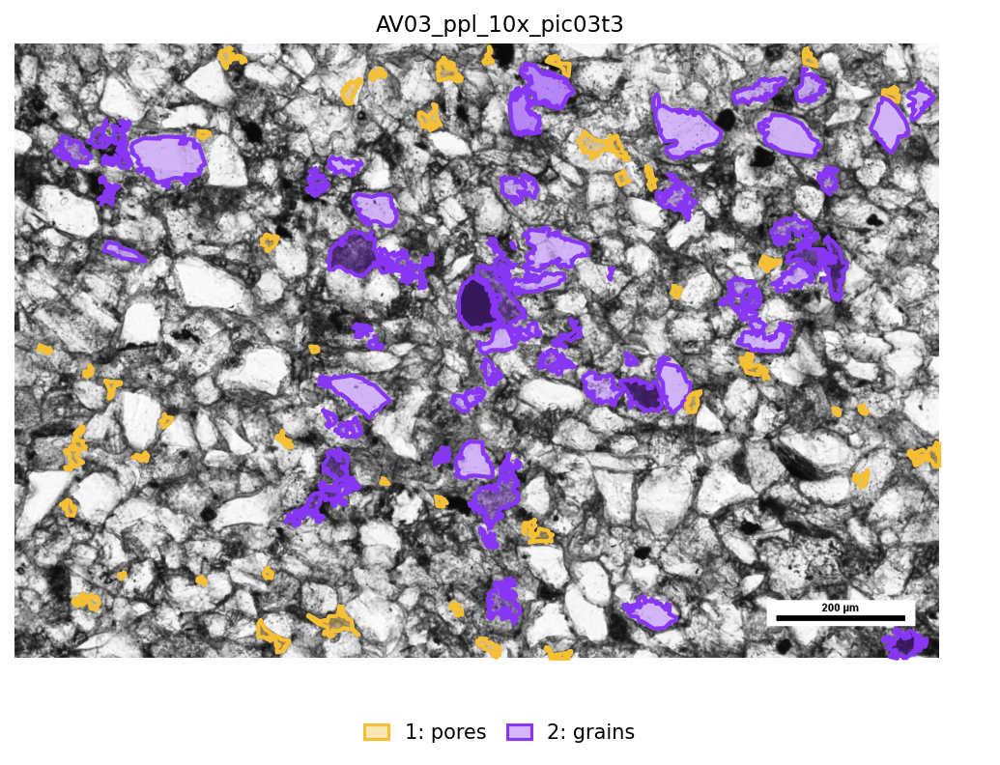

  → outputs/labels/AV03_ppl_10x_pic03t3_labels.png
[2/3] Test images/AV11_ppl_10x_pic04t4.tif
  polygons: 56 | labeled pixels: 198367
  classes: 1:pores=4017, 2:grains=194350
  outputs:
    AV11_ppl_10x_pic04t4_polygons.geojson
    AV11_ppl_10x_pic04t4_session.json


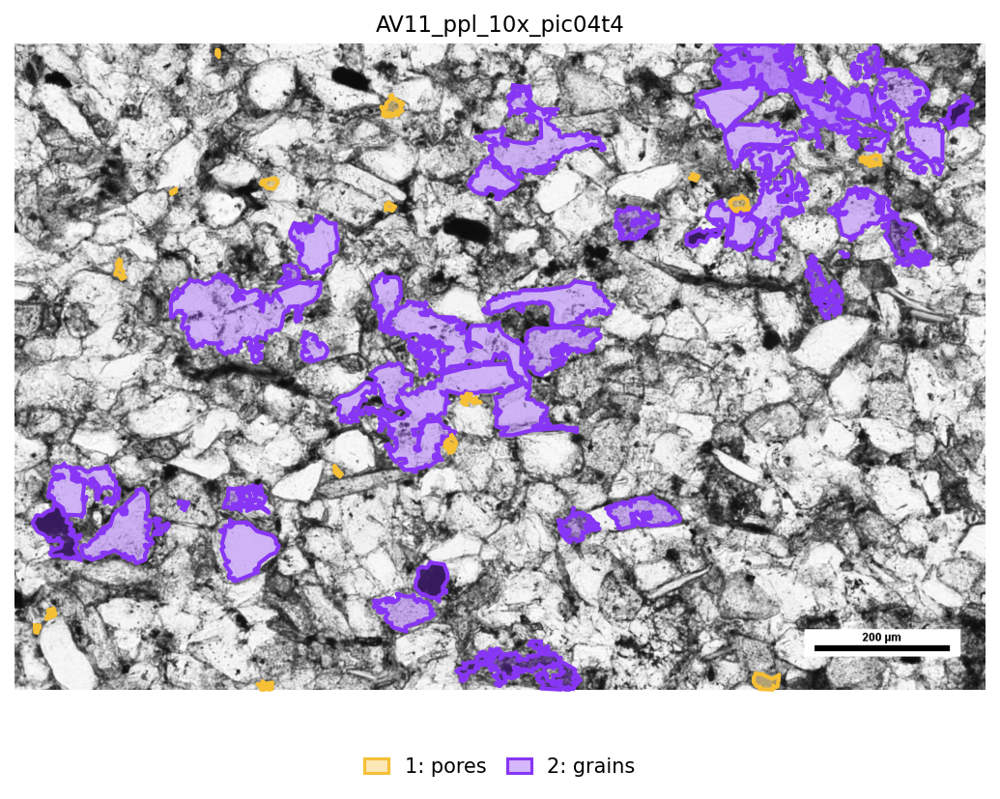

  → outputs/labels/AV11_ppl_10x_pic04t4_labels.png
[3/3] Test images/AV12_ppl_10x_pic03t3.tif
  polygons: 0 | labeled pixels: 0
  classes: (none)
  outputs:
    AV12_ppl_10x_pic03t3_polygons.geojson
    AV12_ppl_10x_pic03t3_session.json


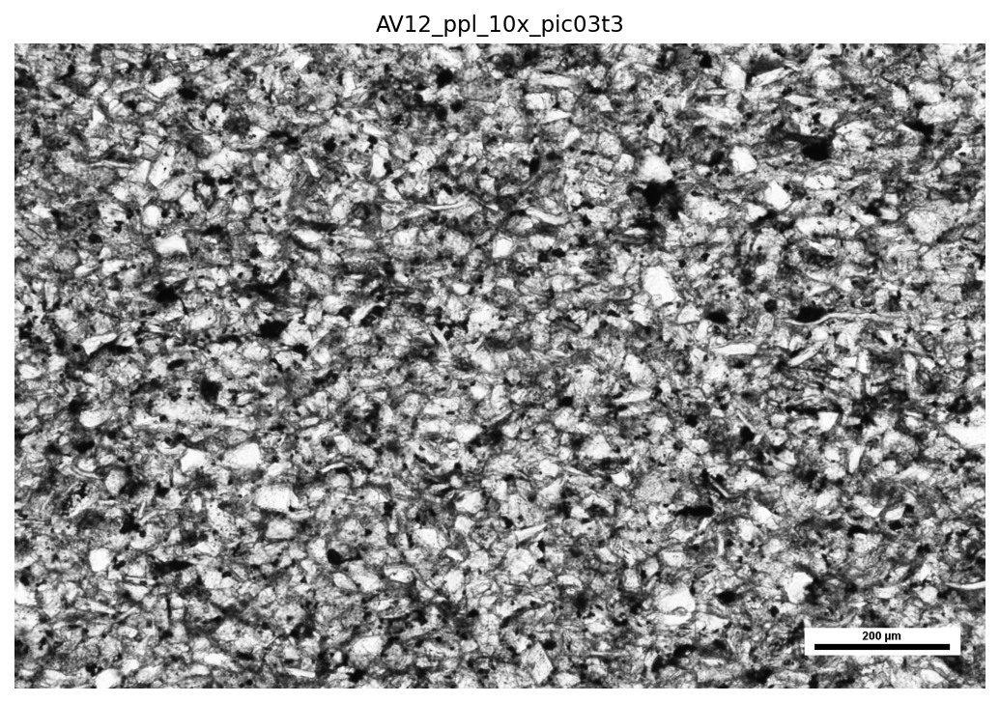

  → outputs/labels/AV12_ppl_10x_pic03t3_labels.png
outputs under: Test images/
  labels/  predictions/
models: outputs/models/


In [6]:
print_label_summary(session)

## Features

Demo uses RGB + local std + local gradient.


Feature preview (downsampled; train uses full res)
view_mp≈6.56 | dpi=150 (preview_dpi)
toggles: {'r': True, 'g': True, 'b': True, 'local_std': True, 'local_grad': True}
[1/3] AV03_ppl_10x_pic03t3 shape=(1088, 1636) | ['r', 'g', 'b', 'local_std_7', 'local_std_21', 'local_std_63', 'local_grad']


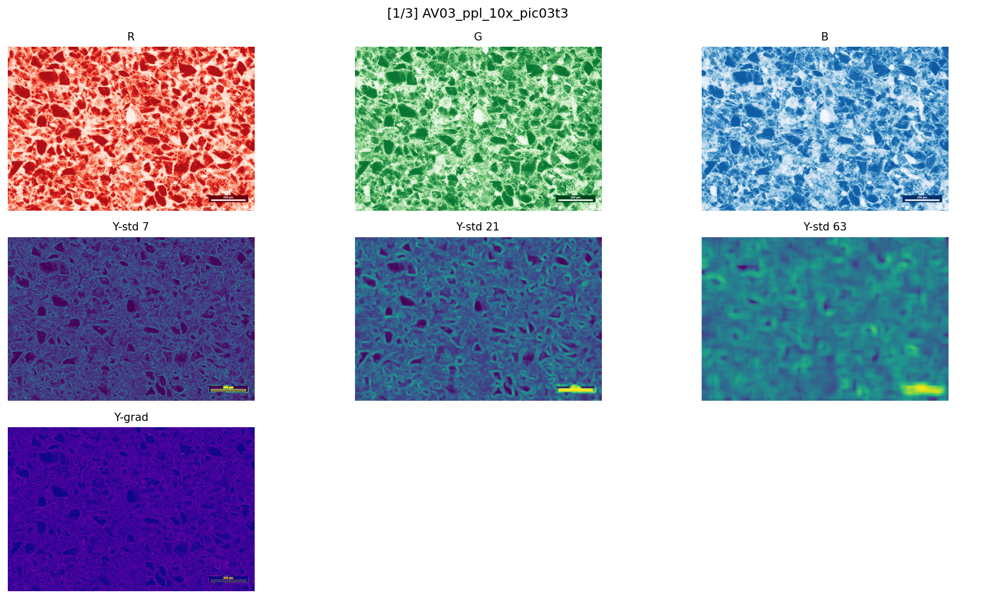

  → outputs/predictions/AV03_ppl_10x_pic03t3_features.png
[2/3] AV11_ppl_10x_pic04t4 shape=(1088, 1636) | ['r', 'g', 'b', 'local_std_7', 'local_std_21', 'local_std_63', 'local_grad']


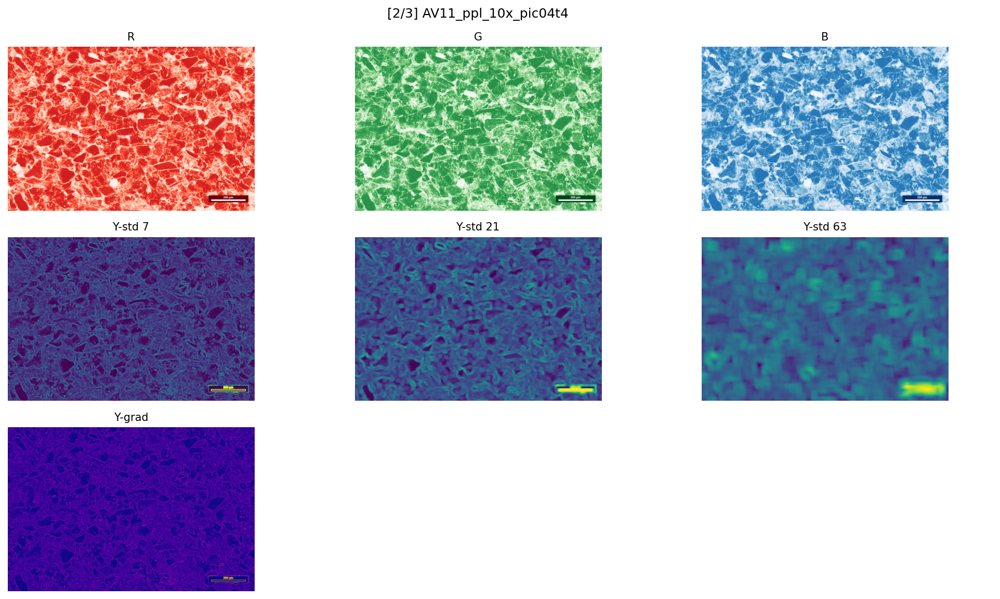

  → outputs/predictions/AV11_ppl_10x_pic04t4_features.png
[3/3] AV12_ppl_10x_pic03t3 shape=(1088, 1636) | ['r', 'g', 'b', 'local_std_7', 'local_std_21', 'local_std_63', 'local_grad']


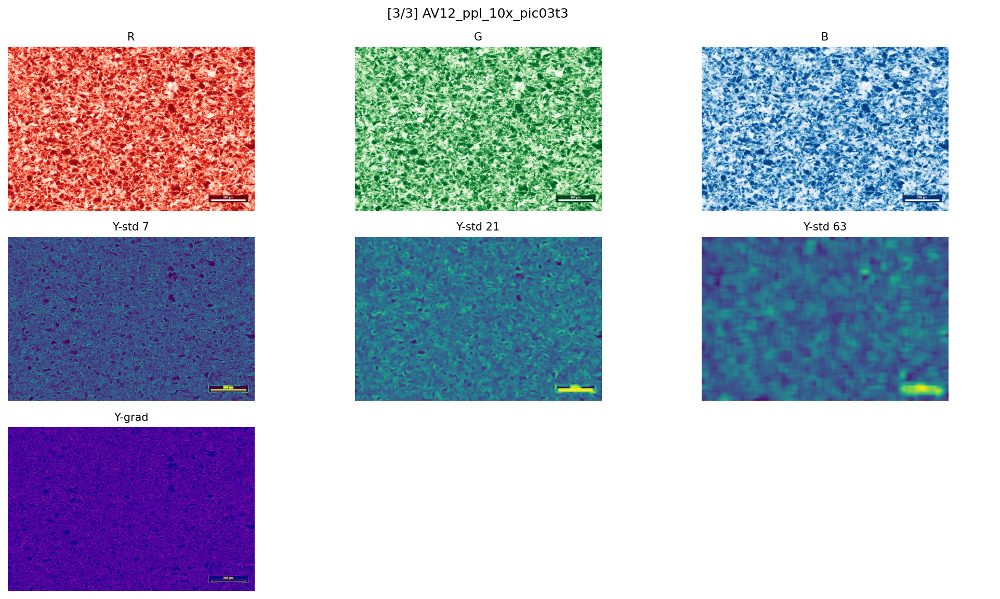

  → outputs/predictions/AV12_ppl_10x_pic03t3_features.png


In [7]:
session.feature_toggles = {
    "r": True,
    "g": True,
    "b": True,
    "local_std": True,
    "local_grad": True,
}
run_feature_preview(session)


## Train

In [8]:
train_results = run_train_cell(
    session,
    mode="retrain",
    scope="universal",
    prompt_load=False,
)


Train
mode: retrain
scope: universal


models: outputs/models/
  universal → outputs/models/universal_model.joblib
pixels: 338180
  AV03_ppl_10x_pic03t3.tif: n_pixels=139813
  AV11_ppl_10x_pic04t4.tif: n_pixels=198367
Skipped (no labels): AV12_ppl_10x_pic03t3.tif
Run the Accuracy (CV) cell for metrics.


## Cross-validation metrics

In [9]:
print_train_metrics(train_results, session=session)

Accuracy (CV)
Note: rows are mineral classes (ids), not CV folds. Metrics are out-of-fold over stratified k-fold CV.
accuracy (stratified 5-fold CV): 99.969%
class          precision      recall    f1-score     support

1 (pores)        99.769%     99.764%     99.766%       22471
2 (grains)       99.983%     99.984%     99.983%      315709

accuracy                                 99.969%      338180
macro avg        99.876%     99.874%     99.875%      338180
weighted avg     99.969%     99.969%     99.969%      338180



## Predict

Predict
model_source: universal
P = model class probability from predict_proba (per-pixel soft score in [0, 1]).
sure_threshold: 0.8  (area_pct_low = pixels with assigned class & P(class) ≥ 0.8)
area_pct = hard (argmax) %;  area_pct_high = max(hard, mean soft P);  +/− from those bounds.


outputs (beside each image folder):
  Test images/predictions/
[1/3] Test images/AV03_ppl_10x_pic03t3.tif
  model: outputs/models/universal_model.joblib
  → outputs/predictions/AV03_ppl_10x_pic03t3_pred.png
  → outputs/predictions/AV03_ppl_10x_pic03t3_pred_rgb.png
  → outputs/predictions/AV03_ppl_10x_pic03t3_confidence.npy
  → outputs/predictions/AV03_ppl_10x_pic03t3_fractions.csv
    pores: 15.88%  +0.64%/−1.19%  (n=281297)
    grains: 84.12%  +0.00%/−1.88%  (n=1489863)


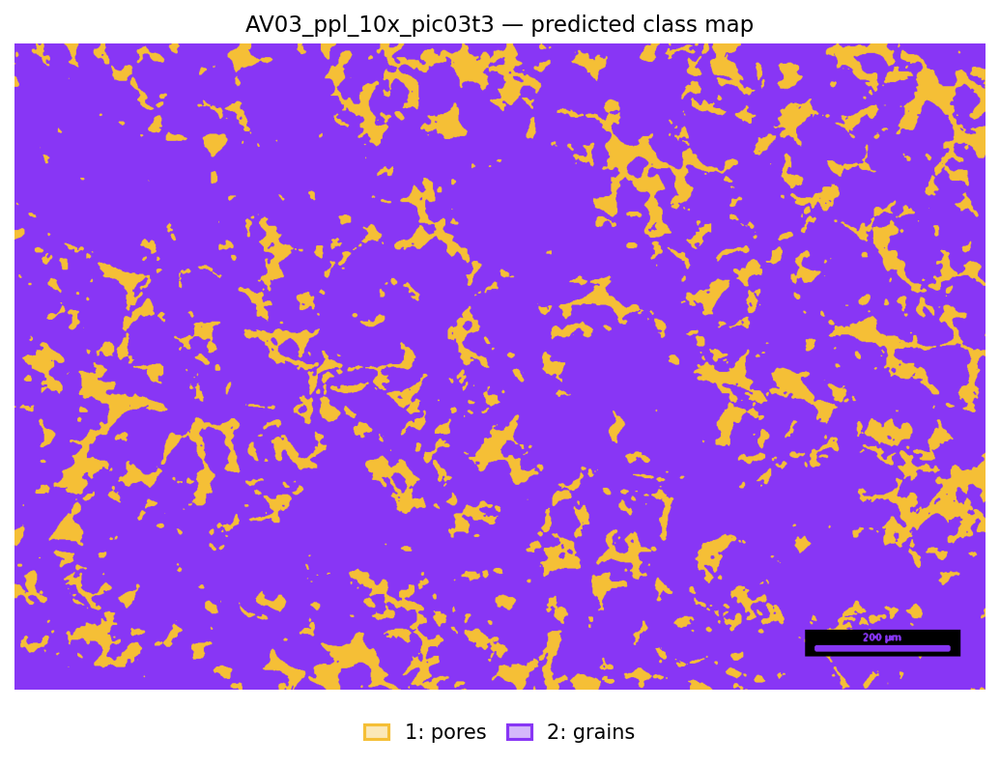

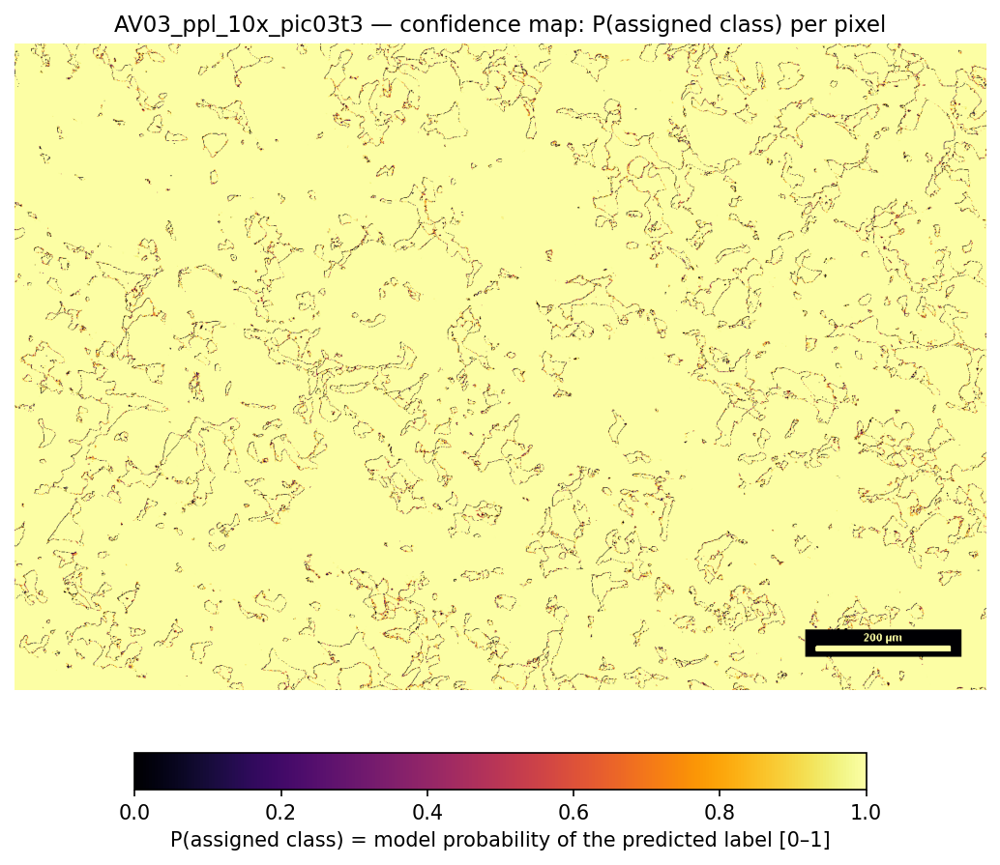

  → outputs/predictions/AV03_ppl_10x_pic03t3_fig_pred.png
  → outputs/predictions/AV03_ppl_10x_pic03t3_fig_confidence.png
[2/3] Test images/AV11_ppl_10x_pic04t4.tif
  model: outputs/models/universal_model.joblib
  → outputs/predictions/AV11_ppl_10x_pic04t4_pred.png
  → outputs/predictions/AV11_ppl_10x_pic04t4_pred_rgb.png
  → outputs/predictions/AV11_ppl_10x_pic04t4_confidence.npy
  → outputs/predictions/AV11_ppl_10x_pic04t4_fractions.csv
    pores: 2.40%  +0.42%/−0.26%  (n=42500)
    grains: 97.60%  +0.00%/−0.80%  (n=1728659)


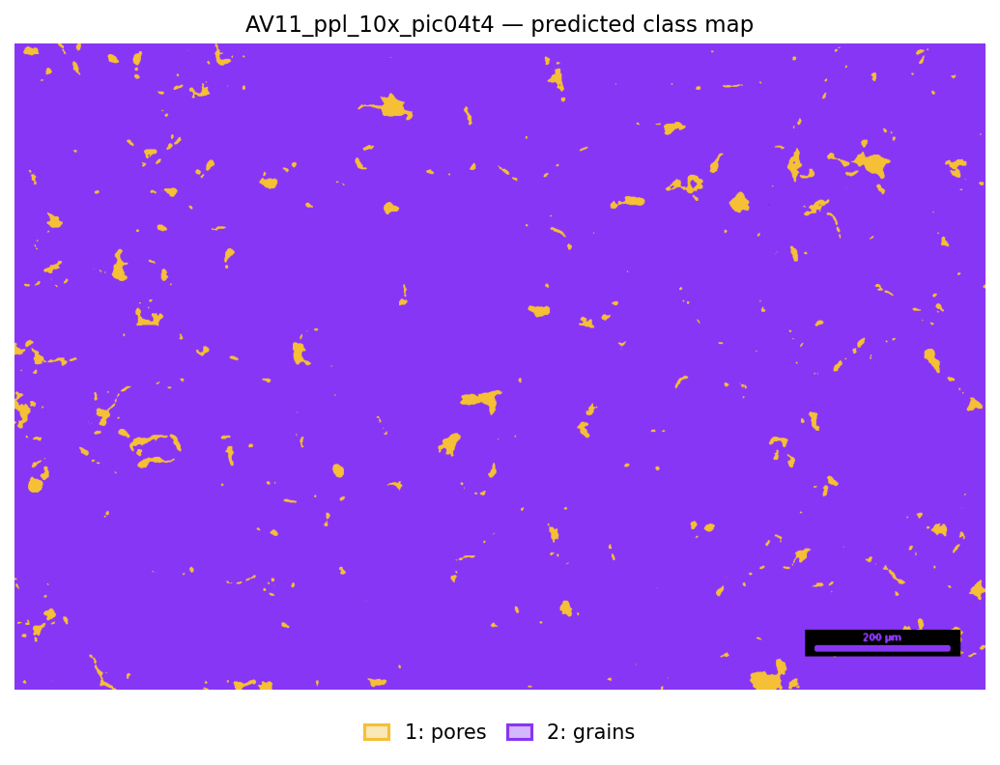

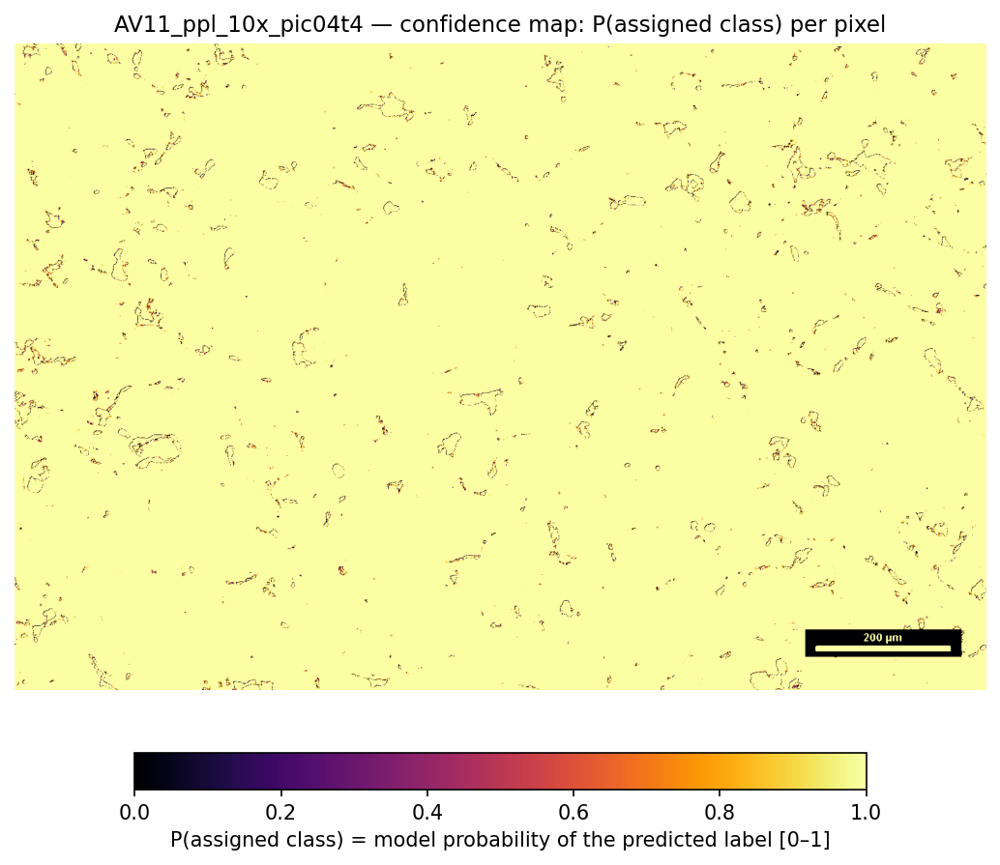

  → outputs/predictions/AV11_ppl_10x_pic04t4_fig_pred.png
  → outputs/predictions/AV11_ppl_10x_pic04t4_fig_confidence.png
[3/3] Test images/AV12_ppl_10x_pic03t3.tif
  model: outputs/models/universal_model.joblib
  → outputs/predictions/AV12_ppl_10x_pic03t3_pred.png
  → outputs/predictions/AV12_ppl_10x_pic03t3_pred_rgb.png
  → outputs/predictions/AV12_ppl_10x_pic03t3_confidence.npy
  → outputs/predictions/AV12_ppl_10x_pic03t3_fractions.csv
    pores: 0.07%  +0.19%/−0.02%  (n=1229)
    grains: 99.93%  +0.00%/−0.31%  (n=1769922)


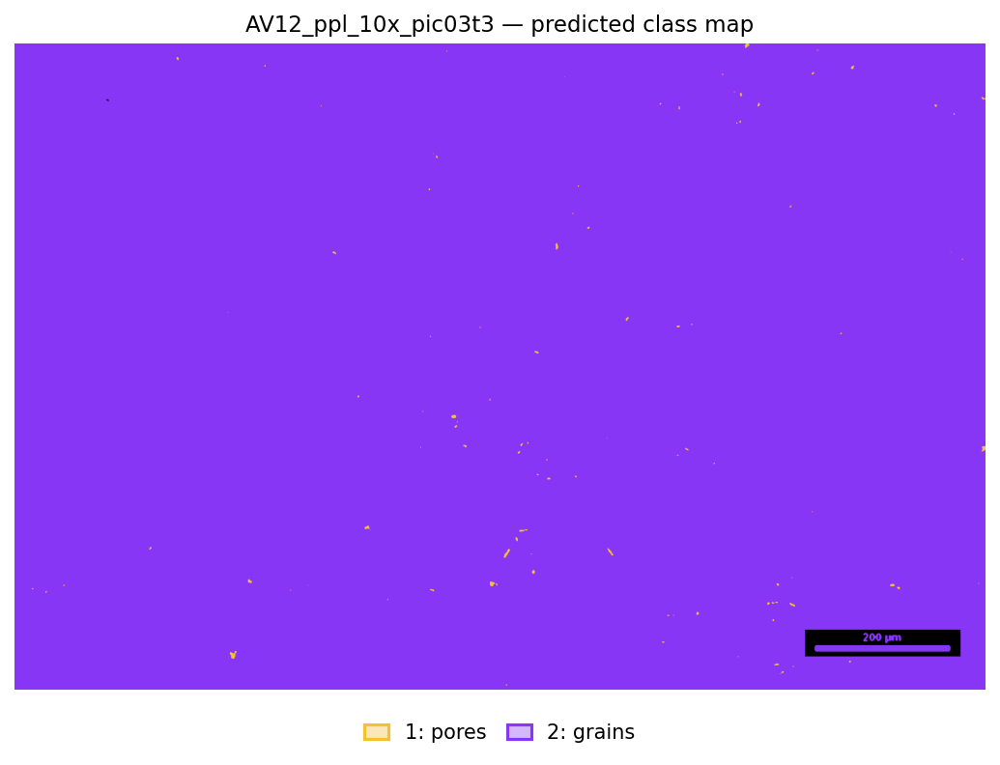

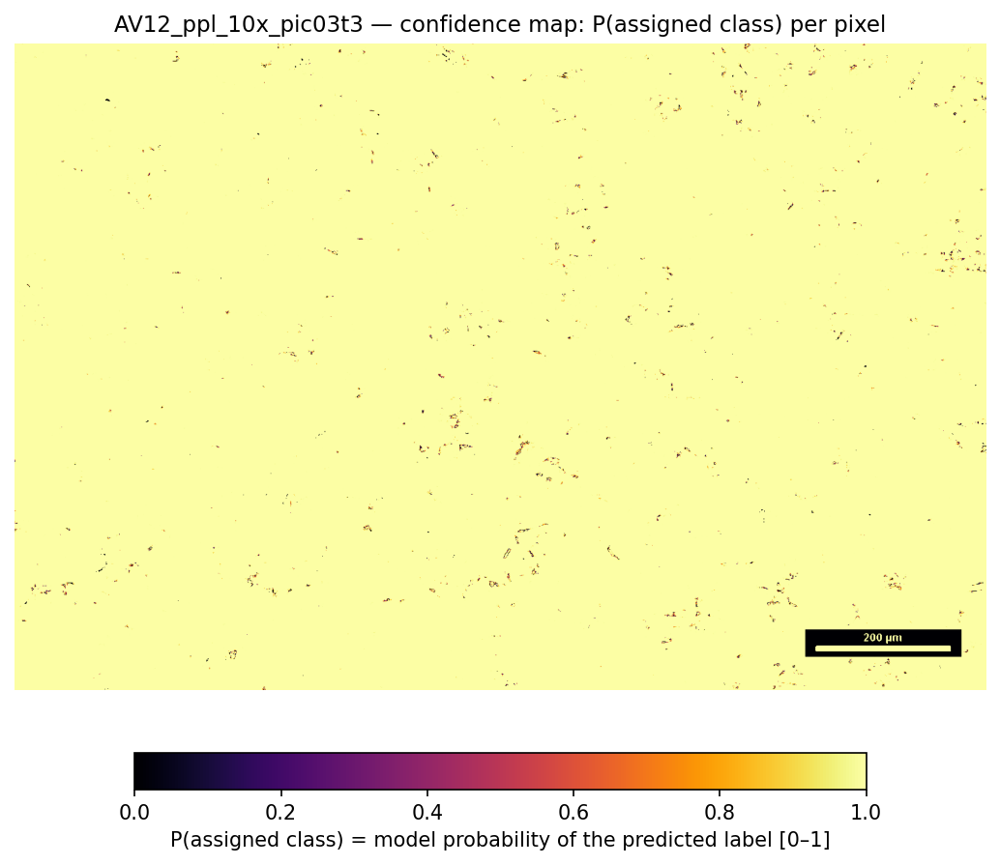

  → outputs/predictions/AV12_ppl_10x_pic03t3_fig_pred.png
  → outputs/predictions/AV12_ppl_10x_pic03t3_fig_confidence.png


In [10]:
predict_results = run_predict_cell(
    session,
    model_source="universal",
)


## Porosity %

Main value is the hard argmax area %. Plus / minus come from the sure-pixel low bound and the soft-probability high bound (`DEFAULT_SURE_PROBA = 0.8`).


In [11]:
import pandas as pd

rows = []
for path in session.image_queue:
    csv = stem_paths(path).fractions_csv
    if not csv.exists():
        print("missing", csv.name)
        continue
    df = pd.read_csv(csv)
    pore = df.loc[df["name"].str.lower() == "pores"]
    if pore.empty:
        print(path.stem, "no pores row")
        continue
    r = pore.iloc[0]
    rows.append({
        "image": path.stem,
        "porosity_pct": float(r["area_pct"]),
        "plus": float(r.get("area_pct_plus", 0)),
        "minus": float(r.get("area_pct_minus", 0)),
    })
    print(f"{path.stem}: {r['area_pct']:.2f}% +{r.get('area_pct_plus', 0):.2f}%/−{r.get('area_pct_minus', 0):.2f}%")

tab = pd.DataFrame(rows)
if len(tab):
    sd = float(tab["porosity_pct"].std(ddof=1)) if len(tab) > 1 else 0.0
    print(f"mean ± sd over {len(tab)} image(s): {tab['porosity_pct'].mean():.2f}% ± {sd:.2f}%")
tab


AV03_ppl_10x_pic03t3: 15.88% +0.64%/−1.19%
AV11_ppl_10x_pic04t4: 2.40% +0.42%/−0.26%
AV12_ppl_10x_pic03t3: 0.07% +0.19%/−0.02%
mean ± sd over 3 image(s): 6.12% ± 8.54%


,image,porosity_pct,plus,minus
0,AV03_ppl_10x_pic03t3,15.88,0.64,1.19
1,AV11_ppl_10x_pic04t4,2.40,0.42,0.26
2,AV12_ppl_10x_pic03t3,0.07,0.19,0.02
